<a href="https://colab.research.google.com/github/suryaperumal2004-creator/Cv-colab/blob/main/Human%20pose.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
pip install mediapipe==0.10.14

/usr/local/lib/python3.12/dist-packages/google/protobuf/symbol_database.py:55: UserWarning: SymbolDatabase.GetPrototype() is deprecated. Please use message_factory.GetMessageClass() instead. SymbolDatabase.GetPrototype() will be removed soon.
  warnings.warn('SymbolDatabase.GetPrototype() is deprecated. Please '


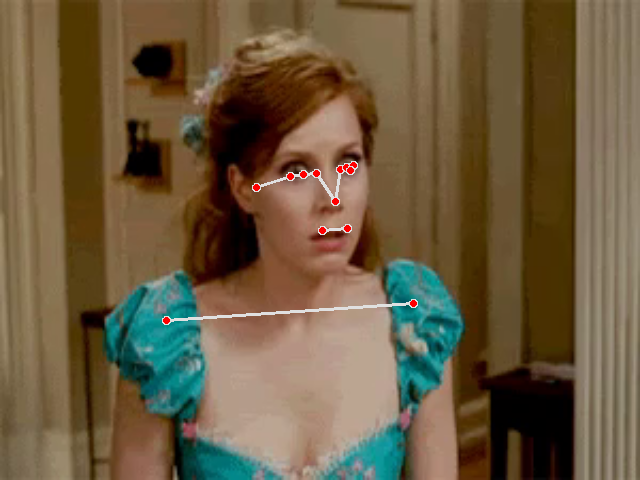

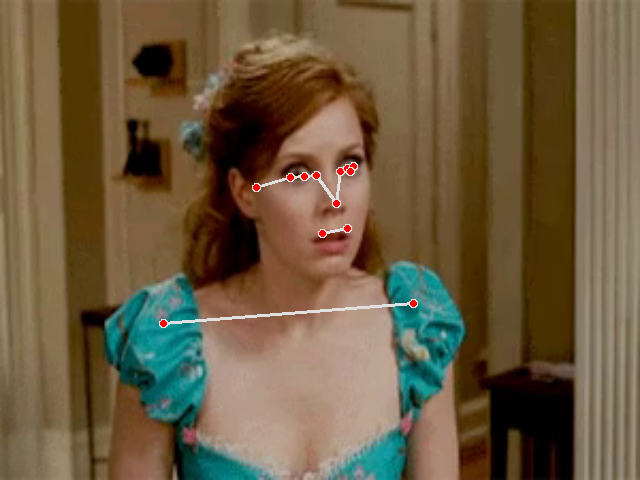

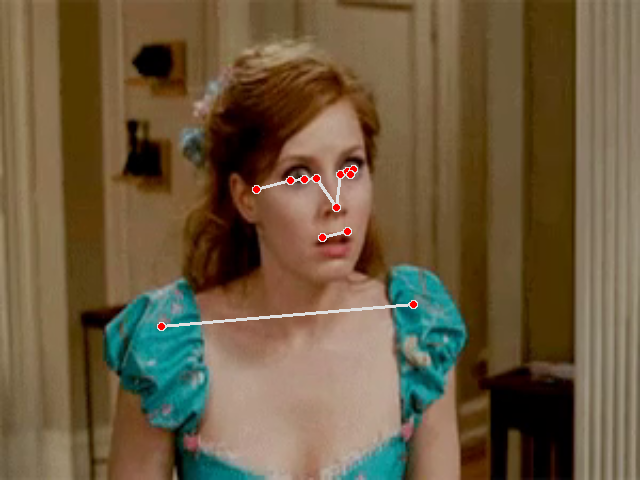

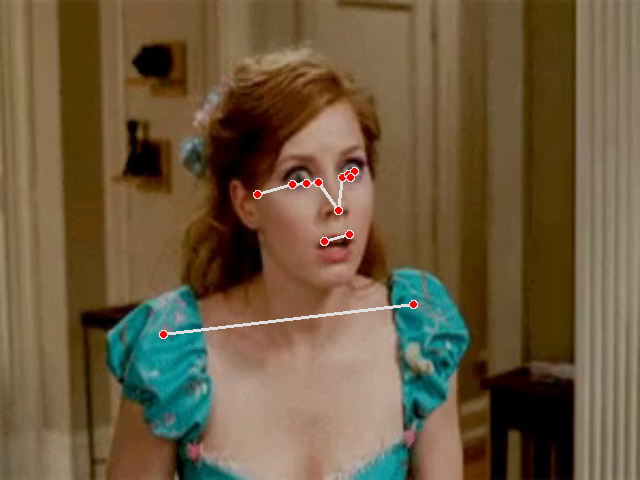

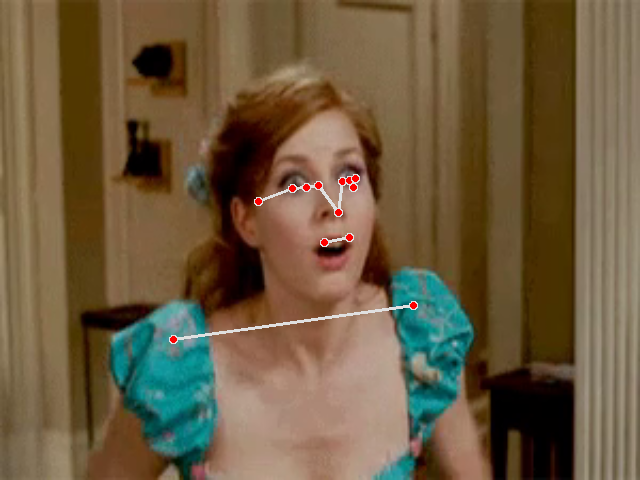

...

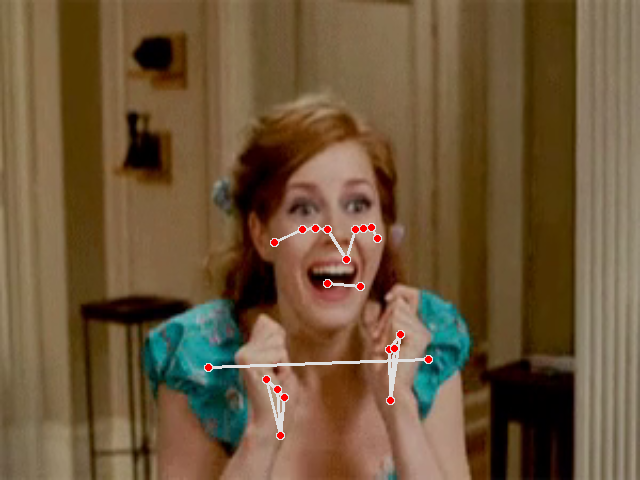

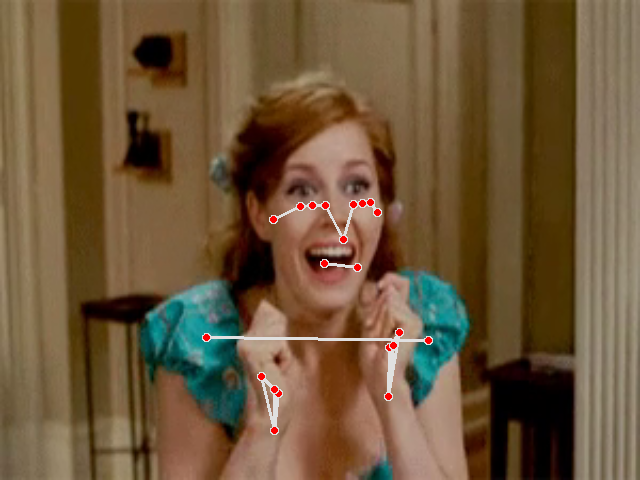

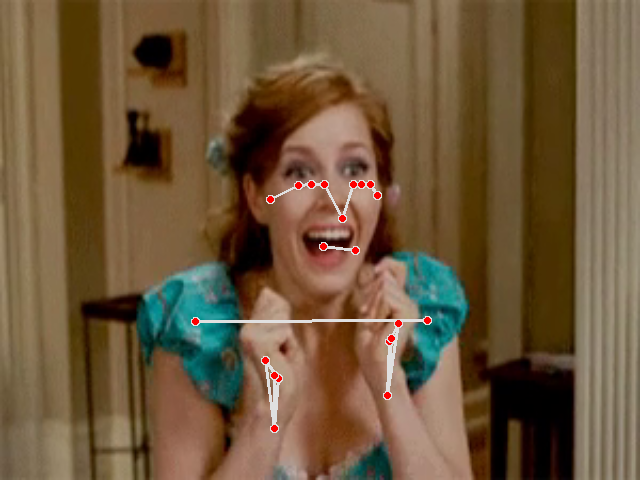

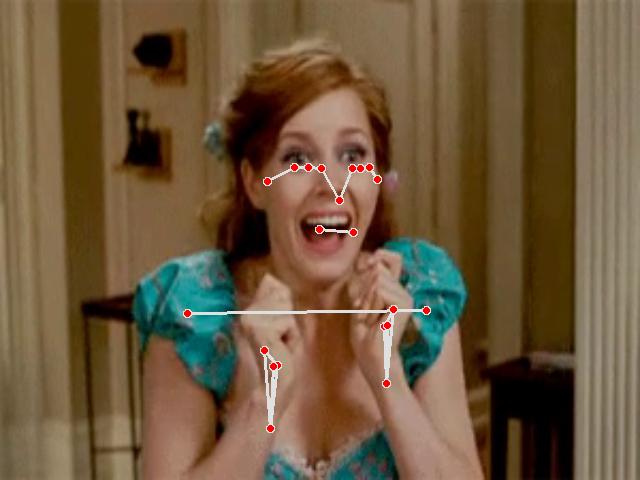

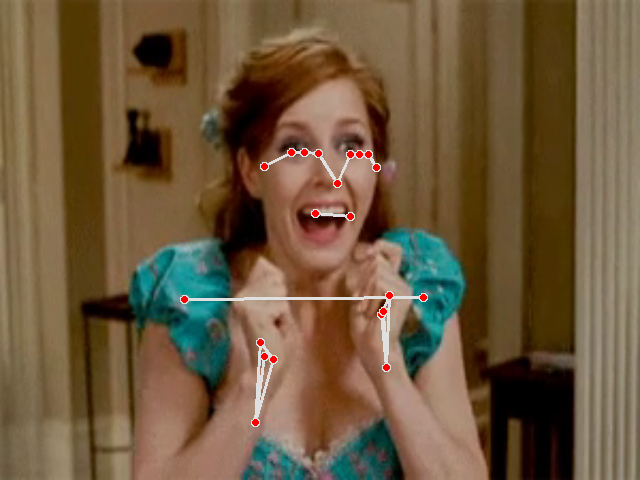

In [ ]:
import cv2
import mediapipe as mp
from google.colab.patches import cv2_imshow

# Initialize MediaPipe Pose model
mp_pose = mp.solutions.pose
pose = mp_pose.Pose(min_detection_confidence=0.5, min_tracking_confidence=0.5)

# Initialize MediaPipe drawing utilities
mp_drawing = mp.solutions.drawing_utils

def estimate_pose_from_video(video_path, width=640, height=480):
    # Capture video from the specified file or webcam
    cap = cv2.VideoCapture(video_path)  # For webcam, use 0 instead of video path (i.e., cv2.VideoCapture(0))

    while cap.isOpened():
        ret, frame = cap.read()  # Read each frame
        if not ret:
            break  # Exit the loop if there are no more frames

        # Resize the frame to a smaller size
        frame_resized = cv2.resize(frame, (width, height))

        # Convert the resized frame to RGB (MediaPipe uses RGB, OpenCV uses BGR)
        frame_rgb = cv2.cvtColor(frame_resized, cv2.COLOR_BGR2RGB)

        # Perform pose estimation
        results = pose.process(frame_rgb)

        # Check if landmarks are detected
        if results.pose_landmarks:
            # Draw the landmarks and connections on the resized frame
            mp_drawing.draw_landmarks(frame_resized, results.pose_landmarks, mp_pose.POSE_CONNECTIONS)

        # Display the output frame
        cv2_imshow(frame_resized)

        # Wait for the 'q' key to stop the video
        if cv2.waitKey(1) & 0xFF == ord('q'):
            break

    cap.release()  # Release the video capture object
    # cv2.destroyAllWindows() # Not needed with cv2_imshow

# Test the function with a video file
video_path ='/content/VID-20260303-WA0000.mp4'  # Replace with the path to your video
estimate_pose_from_video(video_path)